# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зарплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Всего 10 признаков и одна целевая переменная.


**Категориальные признаки:**
- experience_level (SE, MI EN, EX)
- employment_type (FT, PT, CT, FL)
- job_title
- salary_currency
- employee_residence
- remote_ratio (0, 50, 100)
- company_location
- company_size(S, M, L)


**Числовые признаки:**
- work_year
- salary
- salary_in_usd

In [57]:
import warnings
import time
import random
import zipfile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from skimage import color, transform
from sklearn.feature_extraction.image import img_to_graph

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    mean_absolute_percentage_error,
    root_mean_squared_error,
    make_scorer,
    adjusted_rand_score,
    adjusted_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

import gdown

warnings.filterwarnings('ignore')

random.seed(42)
np.random.seed(42)

In [58]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Даны описания переменных. Проверим, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишем цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [59]:
# создадим словарь согласно описаниям переменных из задания
valid_values_categories = {
    'experience_level': {'SE', 'MI', 'EN', 'EX'},
    'employment_type': {'FT', 'PT', 'CT', 'FL'},
    'remote_ratio': {0, 50, 100},
    'company_size': {'S', 'M', 'L'}
}

# создаем цикл для проверки наличия ошибочных значений в категориальных признаках
for col, valid in valid_values_categories.items():
    values = set(df[col].dropna().unique())
    extra_values = values - valid
    if extra_values:
        print(f'{col}: найдены ошибочные значения -> {sorted(extra_values)}')
    else:
        print(f'{col}: ошибочные значения не найдены')


experience_level: ошибочные значения не найдены
employment_type: ошибочные значения не найдены
remote_ratio: ошибочные значения не найдены
company_size: ошибочные значения не найдены


## **Задание 2 (0.3 балла)**

Проведем базовые шаги оценки качества данных.
- Если есть проблемы, устраним их;
- Если нет проблем, то кратко опишим это.

In [60]:
print(df.shape)

(3755, 11)


In [61]:
print(df.head(5))

   work_year experience_level employment_type                 job_title  \
0       2023               SE              FT  Principal Data Scientist   
1       2023               MI              CT               ML Engineer   
2       2023               MI              CT               ML Engineer   
3       2023               SE              FT            Data Scientist   
4       2023               SE              FT            Data Scientist   

   salary salary_currency  salary_in_usd employee_residence  remote_ratio  \
0   80000             EUR          85847                 ES           100   
1   30000             USD          30000                 US           100   
2   25500             USD          25500                 US           100   
3  175000             USD         175000                 CA           100   
4  120000             USD         120000                 CA           100   

  company_location company_size  
0               ES            L  
1               US

In [62]:
print(df.tail(5))

      work_year experience_level employment_type                 job_title  \
3750       2020               SE              FT            Data Scientist   
3751       2021               MI              FT  Principal Data Scientist   
3752       2020               EN              FT            Data Scientist   
3753       2020               EN              CT     Business Data Analyst   
3754       2021               SE              FT      Data Science Manager   

       salary salary_currency  salary_in_usd employee_residence  remote_ratio  \
3750   412000             USD         412000                 US           100   
3751   151000             USD         151000                 US           100   
3752   105000             USD         105000                 US           100   
3753   100000             USD         100000                 US           100   
3754  7000000             INR          94665                 IN            50   

     company_location company_size  
3750   

In [63]:
#Тип данных, статистика по числовым данным
print(df.dtypes)
print(df[['work_year', 'salary', 'salary_in_usd']].describe())


work_year              int64
experience_level      object
employment_type       object
job_title             object
salary                 int64
salary_currency       object
salary_in_usd          int64
employee_residence    object
remote_ratio           int64
company_location      object
company_size          object
dtype: object
         work_year        salary  salary_in_usd
count  3755.000000  3.755000e+03    3755.000000
mean   2022.373635  1.906956e+05  137570.389880
std       0.691448  6.716765e+05   63055.625278
min    2020.000000  6.000000e+03    5132.000000
25%    2022.000000  1.000000e+05   95000.000000
50%    2022.000000  1.380000e+05  135000.000000
75%    2023.000000  1.800000e+05  175000.000000
max    2023.000000  3.040000e+07  450000.000000


In [64]:
# Основные статистики по категориальным столбцам
print("=" * 60)
print("СТАТИСТИКИ ПО КАТЕГОРИАЛЬНЫМ СТОЛБЦАМ")
print("=" * 60)
cat_cols = df.select_dtypes(include=['object', 'category']).columns
for col in cat_cols:
    print(f"\n{col}:")
    print(f"  Уникальных значений: {df[col].nunique()}")
    print(f"  Мода: {df[col].mode()[0]}")
    print(f"  Распределение:")
    print(df[col].value_counts())

СТАТИСТИКИ ПО КАТЕГОРИАЛЬНЫМ СТОЛБЦАМ

experience_level:
  Уникальных значений: 4
  Мода: SE
  Распределение:
experience_level
SE    2516
MI     805
EN     320
EX     114
Name: count, dtype: int64

employment_type:
  Уникальных значений: 4
  Мода: FT
  Распределение:
employment_type
FT    3718
PT      17
CT      10
FL      10
Name: count, dtype: int64

job_title:
  Уникальных значений: 93
  Мода: Data Engineer
  Распределение:
job_title
Data Engineer                          1040
Data Scientist                          840
Data Analyst                            612
Machine Learning Engineer               289
Analytics Engineer                      103
                                       ... 
Principal Machine Learning Engineer       1
Azure Data Engineer                       1
Manager Data Management                   1
Marketing Data Engineer                   1
Finance Data Analyst                      1
Name: count, Length: 93, dtype: int64

salary_currency:
  Уникальных значен

In [65]:
# Пропуски
print(f'Пропуски:\n{df.isna().sum()}')


Пропуски:
work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64


In [66]:
#Дубликаты (полное повторение строк)
print('Количество полных дубликатов:', df.duplicated().sum())
print(f'Доля полных дубликатов: {df.duplicated().mean():.2%}')

pd.set_option('display.max_columns', None)
dups_all = df[df.duplicated(keep=False)].sort_values(list(df.columns))
print(dups_all)

Количество полных дубликатов: 1171
Доля полных дубликатов: 31.19%
      work_year experience_level employment_type           job_title   salary  \
3119       2020               EN              FT       Data Engineer  1000000   
3120       2020               EN              FT       Data Engineer  1000000   
3502       2021               MI              FT       Data Engineer   200000   
3586       2021               MI              FT       Data Engineer   200000   
3665       2021               MI              FT      Data Scientist    76760   
...         ...              ...             ...                 ...      ...   
525        2023               SE              FT  Research Scientist   250000   
956        2023               SE              FT  Research Scientist   250000   
1751       2023               SE              FT  Research Scientist   250000   
1247       2023               SE              FT  Research Scientist   253750   
1249       2023               SE           

In [67]:
#Удаляем дубликаты
df = df.drop_duplicates().reset_index(drop=True)

# Проверка
print('Осталось дубликатов:', df.duplicated().sum())
print('Новый размер датасета:', df.shape)

Осталось дубликатов: 0
Новый размер датасета: (2584, 11)


In [68]:
#Минимальное и максимальное значение salary_in_usd
print(f'Минимальное значение salary_in_usd: {df["salary_in_usd"].min()}')
print(f'Максимальное значение salary_in_usd: {df["salary_in_usd"].max()}')

Минимальное значение salary_in_usd: 5132
Максимальное значение salary_in_usd: 450000


## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

**Ваши выводы здесь**
|Удаленные признаки                           |Причина удаления                             |
|---------------------------------------------|---------------------------------------------|
|salary                                       |содержит информацию о таргете (leakage будет)|
|salary_currency                              |связан с salary — валюта, в которой начисляется зарплата; географическая информация уже содержится в employee_residence и company_location|

In [69]:
# Удаляем лишние признаки
df = df.drop(columns=['salary', 'salary_currency'])
print(f'Удалены столбцы: salary, salary_currency')
print(f'Оставшиеся столбцы: {list(df.columns)}')

#Изучим категории признаков
cat_cols = ['experience_level', 'employment_type', 'job_title', 'employee_residence', 'remote_ratio',
            'company_location', 'company_size']
for col in cat_cols:
    print(f'\n{col}:')
    print(sorted(df[col].dropna().unique()))

Удалены столбцы: salary, salary_currency
Оставшиеся столбцы: ['work_year', 'experience_level', 'employment_type', 'job_title', 'salary_in_usd', 'employee_residence', 'remote_ratio', 'company_location', 'company_size']

experience_level:
['EN', 'EX', 'MI', 'SE']

employment_type:
['CT', 'FL', 'FT', 'PT']

job_title:
['3D Computer Vision Researcher', 'AI Developer', 'AI Programmer', 'AI Scientist', 'Analytics Engineer', 'Applied Data Scientist', 'Applied Machine Learning Engineer', 'Applied Machine Learning Scientist', 'Applied Scientist', 'Autonomous Vehicle Technician', 'Azure Data Engineer', 'BI Analyst', 'BI Data Analyst', 'BI Data Engineer', 'BI Developer', 'Big Data Architect', 'Big Data Engineer', 'Business Data Analyst', 'Business Intelligence Engineer', 'Cloud Data Architect', 'Cloud Data Engineer', 'Cloud Database Engineer', 'Compliance Data Analyst', 'Computer Vision Engineer', 'Computer Vision Software Engineer', 'Data Analyst', 'Data Analytics Consultant', 'Data Analytics En

In [70]:
#Фиксируем признаки, где много категорий
high_cardinality_cols = ['job_title', 'employee_residence', 'company_location']

## **Задание 4 (0.2 балла)**

Разделим выборку на train, test (80%, 20%).

In [71]:
train, test = train_test_split(df, test_size = 0.2, random_state=42 )

In [72]:
# Выбросы (те значения признаков, которые превышают 0.996-квантиль)
num_cols = train.select_dtypes(include = 'number').columns

outliers_summary = []
for col in num_cols:
    upper = train[col].quantile(0.996)
    mask = train[col] > upper

    outliers_summary.append({
        'feature': col,
        'q_0_966': upper,
        'outliers_count': int(mask.sum()),
        'outliers_share': float(mask.mean())
    })

outliers_df = pd.DataFrame(outliers_summary).sort_values('outliers_count', ascending=False)
print(outliers_df)

         feature   q_0_966  outliers_count  outliers_share
1  salary_in_usd  375000.0               8         0.00387
0      work_year    2023.0               0         0.00000
2   remote_ratio     100.0               0         0.00000


In [73]:
#Удаляем выбросы
num_cols = train.select_dtypes(include = 'number').columns

upper_q = train[num_cols].quantile(0.996)
outlier_mask = (train[num_cols]>upper_q).any(axis=1)

train_clean = train.loc[~outlier_mask].copy()

print('Было строк:', train.shape[0])
print('Удалили строк:', outlier_mask.sum())
print('Стало строк:', train_clean.shape[0])

# Используем очищенный train далее
train = train_clean

Было строк: 2067
Удалили строк: 8
Стало строк: 2059


## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовим всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделим данные для тренировки и теста для непрерывных признаков
- Выделим данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируем.

In [74]:
# work_year: категориальный или непрерывный признак? посмотрим на кол-во уникальных значений признака
col = 'work_year'

print('Количество уникальных:', df[col].nunique())
print(f'Уникальные значения: \n{df[col].dropna().unique()}')

Количество уникальных: 4
Уникальные значения: 
[2023 2022 2020 2021]


**work_year будет рассматривать как непрерывный признак**


Признак work_year в теории может быть непрерывным, однако в данном случае он представлен больше как дискретная величина. Но все равно будем рассматривать признак как **непрерывный** , потому что на вход моделе могут быть поданы новые наблюдения. В теории, по рекомендациям Сабрины, можно было бы использовать биннинг, чтобы работать с work_year, как с категорией.

**Непрерывные признаки:**

- work_year — год может принимать произвольные числовые значения, при поступлении новых данных он будет меняться непрерывно

Признак salary был удален ранее как leakage-признак (напрямую связан с целевой переменной salary_in_usd).

**Категориальные признаки:**

- experience level
                   - потому что признак может принимать только 4 значения: SE, MI, EN, EX
- employment_type  - потому что может принимать только 4 значения: FT, PT, CT, FL
- job_title        - потому что может принимать только ограниченное число категорий
- employee_residence  - потому что ограниченное число стран
- remote_ratio    -   потому что может принимать только 3 значения: 0, 50, 100
- company_location -  потому что ограниченное число стран
- company_size     -  потому что может принимать только 3 значения: S, M, L

In [75]:
# Выделим данные для тренировки и теста для непрерывных признаков
continuous_features = ['work_year' ]

X_train_cont = train[continuous_features]
X_test_cont = test[continuous_features]

In [76]:
#Выделим данные для тренировки и теста для непрерывных + категориальных признаков
X_train_all = train[continuous_features + cat_cols]
X_test_all = test[continuous_features + cat_cols]


## **Задание 6 (0.2 балла)**

- Обучим модель линейной регресии на числовых признаках и оценим ее качество через mape и rmse;
- Сделаем вывод о качестве построенной модели;

In [77]:
# Строим модель линейной регрессии на непрерывных признаках
y_train_cont = train['salary_in_usd']
y_test_cont = test['salary_in_usd']

# Масштабируем данные для линейной регрессии
scaler = StandardScaler()
X_train_cont_scaled = scaler.fit_transform(X_train_cont)
X_test_cont_scaled = scaler.transform(X_test_cont)

# Подавляем warnings при обучении и предсказании
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model = LinearRegression()
    model.fit(X_train_cont_scaled, y_train_cont)
    y_pred = model.predict(X_test_cont_scaled)

# MAPE
print('MAPE:', mean_absolute_percentage_error(y_test_cont, y_pred))

# RMSE
print('RMSE:', root_mean_squared_error(y_test_cont, y_pred))

MAPE: 0.8142661792627647
RMSE: 63829.87280837477


**Выводы о качестве построенной модели:**
- По RMSE большая ошибка. Ошибка в предсказании зарплаты в среднем составляет 64 тысячи долларов, что довольно-таки много.
- По MAPE модель в среднем ошибается на ~81% относительно правильных ответов.
- Модель необходимо улучшить

## **Задание 8 (0.2 балла)**

- Обучим модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените ее качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [78]:
# Обучим модель (возьмем catboost модель):
cb_model = CatBoostRegressor(verbose = 0, random_state=42)
cb_model.fit(X_train_cont, y_train_cont)

y_pred_cb = cb_model.predict(X_test_cont)

#MAPE
print('MAPE:', mean_absolute_percentage_error(y_test_cont, y_pred_cb))
#RMSE
print('RMSE:', root_mean_squared_error(y_test_cont, y_pred_cb))

MAPE: 0.7941821018435175
RMSE: 63557.49979487588


**Выводы о качестве построенной модели:**
- CatBoost на одном непрерывном признаке (work_year) показывает результаты сопоставимые с линейной регрессией.
- Причина: один признак не дает достаточной информации для предсказания зарплаты.
- Для улучшения качества необходимо подключить категориальные признаки.

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попробуем разные стратегии предобработки.

**1:**
- Предобработаем категориальные признаки при помощи OHE
- Построим модель бустинга и линейную регрессию
- Оценим качество обеих моделей

**2:**
- Предобработаем категориальные признаки при помощи LabelEncoding
- Построим модель бустинга и линейную регрессию
- Оценим качество обеих моделей

**3:**
- Предобработаем категориальные признаки при помощи MeanTargetEnc
- Построим модель бустинга и линейную регрессию
- Оценим качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

### 1. One-Hot Encoding (OHE)

In [79]:
# Предобработаем категориальные признаки при помощи OHE

# Применяем OHE ко всем данным (OHE применится только к cat_cols)
X_train_ohe = pd.get_dummies(X_train_all, columns=cat_cols, drop_first=True)
X_test_ohe = pd.get_dummies(X_test_all, columns=cat_cols, drop_first=True)

# Убедимся, что test имеет те же столбцы, что и train
X_test_ohe = X_test_ohe.reindex(columns=X_train_ohe.columns, fill_value=0)

print(f"Размер X_train_ohe: {X_train_ohe.shape}")
print(f"Размер X_test_ohe: {X_test_ohe.shape}")

# Построим модель бустинга (не требует масштабирования)
cb_model_ohe = CatBoostRegressor(verbose=0, random_state=42)
cb_model_ohe.fit(X_train_ohe, y_train_cont)

# Предсказания CatBoost
y_pred_cb_ohe = cb_model_ohe.predict(X_test_ohe)

# Оценим качество CatBoost
rmse_cb_ohe = root_mean_squared_error(y_test_cont, y_pred_cb_ohe)
mape_cb_ohe = mean_absolute_percentage_error(y_test_cont, y_pred_cb_ohe)

print(f"\n=== CatBoost с OHE ===")
print(f"  RMSE: {rmse_cb_ohe:.2f}")
print(f"  MAPE: {mape_cb_ohe:.4f} ({mape_cb_ohe*100:.2f}%)")

# Для линейной регрессии нужно масштабирование
# Удаляем константные столбцы (если есть)
non_constant_cols = X_train_ohe.columns[X_train_ohe.std() != 0]
X_train_ohe_filtered = X_train_ohe[non_constant_cols]
X_test_ohe_filtered = X_test_ohe[non_constant_cols]

scaler = StandardScaler()
X_train_ohe_scaled = scaler.fit_transform(X_train_ohe_filtered)
X_test_ohe_scaled = scaler.transform(X_test_ohe_filtered)

# Построим линейную регрессию
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    lr_model_ohe = LinearRegression()
    lr_model_ohe.fit(X_train_ohe_scaled, y_train_cont)
    y_pred_lr_ohe = lr_model_ohe.predict(X_test_ohe_scaled)

# Оценим качество линейной регрессии
rmse_lr_ohe = root_mean_squared_error(y_test_cont, y_pred_lr_ohe)
mape_lr_ohe = mean_absolute_percentage_error(y_test_cont, y_pred_lr_ohe)

print(f"\n=== Линейная регрессия с OHE ===")
print(f"  RMSE: {rmse_lr_ohe:.2f}")
print(f"  MAPE: {mape_lr_ohe:.4f} ({mape_lr_ohe*100:.2f}%)")

Размер X_train_ohe: (2059, 236)
Размер X_test_ohe: (517, 236)

=== CatBoost с OHE ===
  RMSE: 51038.95
  MAPE: 0.4054 (40.54%)

=== Линейная регрессия с OHE ===
  RMSE: 52586.11
  MAPE: 0.4361 (43.61%)


In [80]:
# Предобработаем категориальные признаки при помощи LabelEncoding

# Создаем копии данных (важно - копируем значения, не ссылки)
X_train_le = X_train_all.copy()
X_test_le = X_test_all.copy()

# Применяем Label Encoding к каждому категориальному признаку
label_encoders = {}

for col in cat_cols:
    le = LabelEncoder()
    
    # Обучаем на train и трансформируем
    X_train_le[col] = le.fit_transform(X_train_all[col].astype(str))
    
    # Для test обрабатываем unknown категории
    test_values = X_test_all[col].astype(str)
    
    # Заменяем unknown значения на -1 для unknown категорий
    test_encoded = []
    for val in test_values:
        if val in le.classes_:
            test_encoded.append(le.transform([val])[0])
        else:
            # Присваиваем -1 для unknown категорий
            test_encoded.append(-1)
    
    X_test_le[col] = test_encoded
    label_encoders[col] = le

# Проверим результат
print(f"Размер X_train_le: {X_train_le.shape}")
print(f"Размер X_test_le: {X_test_le.shape}")

# Построим модель бустинга (не требует масштабирования)
cb_model_le = CatBoostRegressor(verbose=0, random_state=42)
cb_model_le.fit(X_train_le, y_train_cont)

# Предсказания CatBoost
y_pred_cb_le = cb_model_le.predict(X_test_le)

# Оценим качество CatBoost
rmse_cb_le = root_mean_squared_error(y_test_cont, y_pred_cb_le)
mape_cb_le = mean_absolute_percentage_error(y_test_cont, y_pred_cb_le)

print(f"\n=== CatBoost с Label Encoding ===")
print(f"  RMSE: {rmse_cb_le:.2f}")
print(f"  MAPE: {mape_cb_le:.4f} ({mape_cb_le*100:.2f}%)")

# Для линейной регрессии нужно масштабирование
# Удаляем константные столбцы (если есть)
non_constant_cols = X_train_le.columns[X_train_le.std() != 0]
X_train_le_filtered = X_train_le[non_constant_cols]
X_test_le_filtered = X_test_le[non_constant_cols]

scaler = StandardScaler()
X_train_le_scaled = scaler.fit_transform(X_train_le_filtered)
X_test_le_scaled = scaler.transform(X_test_le_filtered)

# Построим линейную регрессию
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    lr_model_le = LinearRegression()
    lr_model_le.fit(X_train_le_scaled, y_train_cont)
    y_pred_lr_le = lr_model_le.predict(X_test_le_scaled)

# Оценим качество линейной регрессии
rmse_lr_le = root_mean_squared_error(y_test_cont, y_pred_lr_le)
mape_lr_le = mean_absolute_percentage_error(y_test_cont, y_pred_lr_le)

print(f"\n=== Линейная регрессия с Label Encoding ===")
print(f"  RMSE: {rmse_lr_le:.2f}")
print(f"  MAPE: {mape_lr_le:.4f} ({mape_lr_le*100:.2f}%)")

Размер X_train_le: (2059, 8)
Размер X_test_le: (517, 8)

=== CatBoost с Label Encoding ===
  RMSE: 53524.72
  MAPE: 0.5358 (53.58%)

=== Линейная регрессия с Label Encoding ===
  RMSE: 55822.70
  MAPE: 0.5628 (56.28%)


In [81]:
# Предобработаем категориальные признаки при помощи Mean Target Encoding

# Создаем копии данных
X_train_mte = X_train_all.copy()
X_test_mte = X_test_all.copy()

# Применяем Mean Target Encoding к каждому категориальному признаку
target_encodings = {}

for col in cat_cols:
    # Создаем временный DataFrame для вычисления средних
    temp_df = X_train_all[[col]].copy()
    temp_df['target'] = y_train_cont.values
    
    # Вычисляем среднее значение target для каждой категории
    means = temp_df.groupby(col)['target'].mean()
    
    # Сохраняем encoding для каждого признака
    target_encodings[col] = means
    
    # Применяем к train
    X_train_mte[col] = X_train_all[col].map(means)
    
    # Для test: применяем encoding, для unknown категорий используем общее среднее
    global_mean = y_train_cont.mean()
    X_test_mte[col] = X_test_all[col].map(means).fillna(global_mean)

# Проверим результат
print(f"Размер X_train_mte: {X_train_mte.shape}")
print(f"Размер X_test_mte: {X_test_mte.shape}")

# Построим модель бустинга (не требует масштабирования)
cb_model_mte = CatBoostRegressor(verbose=0, random_state=42)
cb_model_mte.fit(X_train_mte, y_train_cont)

# Предсказания CatBoost
y_pred_cb_mte = cb_model_mte.predict(X_test_mte)

# Оценим качество CatBoost
rmse_cb_mte = root_mean_squared_error(y_test_cont, y_pred_cb_mte)
mape_cb_mte = mean_absolute_percentage_error(y_test_cont, y_pred_cb_mte)

print(f"\n=== CatBoost с Mean Target Encoding ===")
print(f"  RMSE: {rmse_cb_mte:.2f}")
print(f"  MAPE: {mape_cb_mte:.4f} ({mape_cb_mte*100:.2f}%)")

# Для линейной регрессии нужно масштабирование
# Удаляем константные столбцы (если есть)
non_constant_cols = X_train_mte.columns[X_train_mte.std() != 0]
X_train_mte_filtered = X_train_mte[non_constant_cols]
X_test_mte_filtered = X_test_mte[non_constant_cols]

scaler = StandardScaler()
X_train_mte_scaled = scaler.fit_transform(X_train_mte_filtered)
X_test_mte_scaled = scaler.transform(X_test_mte_filtered)

# Построим линейную регрессию
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    lr_model_mte = LinearRegression()
    lr_model_mte.fit(X_train_mte_scaled, y_train_cont)
    y_pred_lr_mte = lr_model_mte.predict(X_test_mte_scaled)

# Оценим качество линейной регрессии
rmse_lr_mte = root_mean_squared_error(y_test_cont, y_pred_lr_mte)
mape_lr_mte = mean_absolute_percentage_error(y_test_cont, y_pred_lr_mte)

print(f"\n=== Линейная регрессия с Mean Target Encoding ===")
print(f"  RMSE: {rmse_lr_mte:.2f}")
print(f"  MAPE: {mape_lr_mte:.4f} ({mape_lr_mte*100:.2f}%)")

Размер X_train_mte: (2059, 8)
Размер X_test_mte: (517, 8)

=== CatBoost с Mean Target Encoding ===
  RMSE: 51329.97
  MAPE: 0.4294 (42.94%)

=== Линейная регрессия с Mean Target Encoding ===
  RMSE: 50773.56
  MAPE: 0.4489 (44.89%)


СВОДНАЯ ТАБЛИЦА РЕЗУЛЬТАТОВ
      Стратегия           Модель         RMSE     MAPE
            OHE         CatBoost 51038.951153 0.405407
            OHE LinearRegression 52586.112783 0.436144
 Label Encoding         CatBoost 53524.719703 0.535826
 Label Encoding LinearRegression 55822.699553 0.562802
Mean Target Enc         CatBoost 51329.966530 0.429422
Mean Target Enc LinearRegression 50773.564886 0.448855


 ЛУЧШИЕ МОДЕЛИ:
--------------------------------------------------------------------------------
По RMSE: LinearRegression с Mean Target Enc
  RMSE = 50773.56
  MAPE = 0.4489 (44.89%)

По MAPE: CatBoost с OHE
  RMSE = 51038.95
  MAPE = 0.4054 (40.54%)


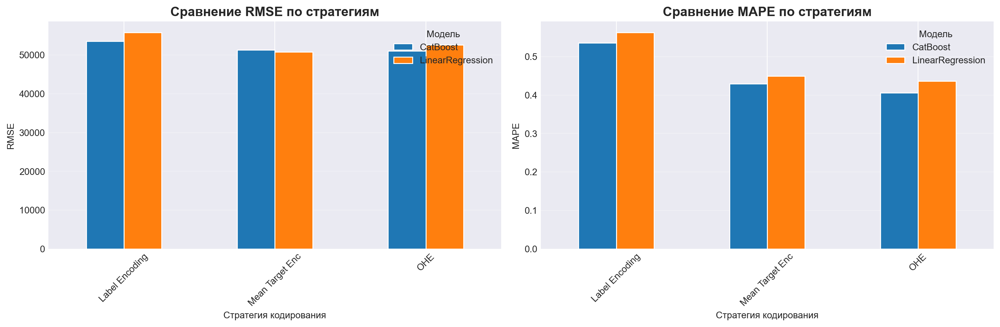


ВЫВОДЫ:

1. Лучший CatBoost: OHE (RMSE=51038.95, MAPE=0.4054)
2. Лучшая LinearRegression: Mean Target Enc (RMSE=50773.56, MAPE=0.4489)


In [82]:
# Сравнение всех трех стратегий кодирования

print("="*80)
print("СВОДНАЯ ТАБЛИЦА РЕЗУЛЬТАТОВ")
print("="*80)

# Создаем DataFrame с результатами
results = pd.DataFrame({
    'Стратегия': ['OHE', 'OHE', 'Label Encoding', 'Label Encoding', 'Mean Target Enc', 'Mean Target Enc'],
    'Модель': ['CatBoost', 'LinearRegression', 'CatBoost', 'LinearRegression', 'CatBoost', 'LinearRegression'],
    'RMSE': [rmse_cb_ohe, rmse_lr_ohe, rmse_cb_le, rmse_lr_le, rmse_cb_mte, rmse_lr_mte],
    'MAPE': [mape_cb_ohe, mape_lr_ohe, mape_cb_le, mape_lr_le, mape_cb_mte, mape_lr_mte]
})

# Форматируем вывод
print(results.to_string(index=False))
print("\n" + "="*80)

# Находим лучшую модель по RMSE
best_rmse_idx = results['RMSE'].idxmin()
best_mape_idx = results['MAPE'].idxmin()

print("\n ЛУЧШИЕ МОДЕЛИ:")
print("-" * 80)
print(f"По RMSE: {results.loc[best_rmse_idx, 'Модель']} с {results.loc[best_rmse_idx, 'Стратегия']}")
print(f"  RMSE = {results.loc[best_rmse_idx, 'RMSE']:.2f}")
print(f"  MAPE = {results.loc[best_rmse_idx, 'MAPE']:.4f} ({results.loc[best_rmse_idx, 'MAPE']*100:.2f}%)")

print(f"\nПо MAPE: {results.loc[best_mape_idx, 'Модель']} с {results.loc[best_mape_idx, 'Стратегия']}")
print(f"  RMSE = {results.loc[best_mape_idx, 'RMSE']:.2f}")
print(f"  MAPE = {results.loc[best_mape_idx, 'MAPE']:.4f} ({results.loc[best_mape_idx, 'MAPE']*100:.2f}%)")

# Визуализация результатов
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# График RMSE
results_pivot_rmse = results.pivot(index='Стратегия', columns='Модель', values='RMSE')
results_pivot_rmse.plot(kind='bar', ax=axes[0], rot=45)
axes[0].set_title('Сравнение RMSE по стратегиям', fontsize=14, fontweight='bold')
axes[0].set_ylabel('RMSE')
axes[0].set_xlabel('Стратегия кодирования')
axes[0].legend(title='Модель')
axes[0].grid(axis='y', alpha=0.3)

# График MAPE
results_pivot_mape = results.pivot(index='Стратегия', columns='Модель', values='MAPE')
results_pivot_mape.plot(kind='bar', ax=axes[1], rot=45)
axes[1].set_title('Сравнение MAPE по стратегиям', fontsize=14, fontweight='bold')
axes[1].set_ylabel('MAPE')
axes[1].set_xlabel('Стратегия кодирования')
axes[1].legend(title='Модель')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("ВЫВОДЫ:")
print("="*80)

# Автоматические выводы
catboost_results = results[results['Модель'] == 'CatBoost']
lr_results = results[results['Модель'] == 'LinearRegression']

best_catboost = catboost_results.loc[catboost_results['RMSE'].idxmin()]
best_lr = lr_results.loc[lr_results['RMSE'].idxmin()]

print(f"\n1. Лучший CatBoost: {best_catboost['Стратегия']} (RMSE={best_catboost['RMSE']:.2f}, MAPE={best_catboost['MAPE']:.4f})")
print(f"2. Лучшая LinearRegression: {best_lr['Стратегия']} (RMSE={best_lr['RMSE']:.2f}, MAPE={best_lr['MAPE']:.4f})")

# Сравнение CatBoost vs LinearRegression
if best_catboost['RMSE'] < best_lr['RMSE']:
    print(f"\n3. CatBoost превосходит LinearRegression на {((best_lr['RMSE'] - best_catboost['RMSE']) / best_lr['RMSE'] * 100):.2f}%")
    print(f"   Рекомендуется использовать: CatBoost с {best_catboost['Стратегия']}")

# Сохраняем лучшую модель для дальнейшей работы
if results.loc[best_rmse_idx, 'Модель'] == 'CatBoost':
    if results.loc[best_rmse_idx, 'Стратегия'] == 'OHE':
        best_model = cb_model_ohe
        X_train_best = X_train_ohe
        X_test_best = X_test_ohe
        best_strategy = "OHE"
    elif results.loc[best_rmse_idx, 'Стратегия'] == 'Label Encoding':
        best_model = cb_model_le
        X_train_best = X_train_le
        X_test_best = X_test_le
        best_strategy = "Label Encoding"
    else:
        best_model = cb_model_mte
        X_train_best = X_train_mte
        X_test_best = X_test_mte
        best_strategy = "Mean Target Encoding"
else:
    if results.loc[best_rmse_idx, 'Стратегия'] == 'OHE':
        best_model = lr_model_ohe
        X_train_best = X_train_ohe_scaled
        X_test_best = X_test_ohe_scaled
        best_strategy = "OHE"
    elif results.loc[best_rmse_idx, 'Стратегия'] == 'Label Encoding':
        best_model = lr_model_le
        X_train_best = X_train_le_scaled
        X_test_best = X_test_le_scaled
        best_strategy = "Label Encoding"
    else:
        best_model = lr_model_mte
        X_train_best = X_train_mte_scaled
        X_test_best = X_test_mte_scaled
        best_strategy = "Mean Target Encoding"

**Выводы по заданию 9:**

1. **Лучшая модель по MAPE — CatBoost + OHE (MAPE ~40.5%).**

2. **LinearRegression + Mean Target Encoding показывает лучший RMSE.** Mean Target Encoding в текущей реализации считает среднее значение таргета по категориям прямо на обучающей выборке и подставляет его обратно в признаки. Это приводит к утечке информации (data leakage). Для честного сравнения MTE нужно применять через кросс-валидацию (считать средние на фолдах, отличных от текущего).

4. **Итого: лучшей моделью выбираем CatBoost + OHE**, так как она показывает лучший MAPE без утечки информации. Далее будем работать с ней.

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

АНАЛИЗ ОШИБОК: CatBoost с OHE

ТОП-20 ПРИМЕРОВ С НАИБОЛЬШЕЙ ОШИБКОЙ:
--------------------------------------------------------------------------------
 Реальная зарплата  Предсказанная зарплата  Абсолютная ошибка  Относительная ошибка (%) experience_level employment_type                          job_title company_size  remote_ratio
            430967            62472.216601      368494.783399                 85.504176               MI              FT                       Data Analyst            M             0
            385000           130498.886620      254501.113380                 66.104185               SE              FT                       Data Analyst            M             0
            315000           158563.132269      156436.867731                 49.662498               SE              FT                      Data Engineer            M           100
             72000           223168.903862      151168.903862                209.956811               SE              

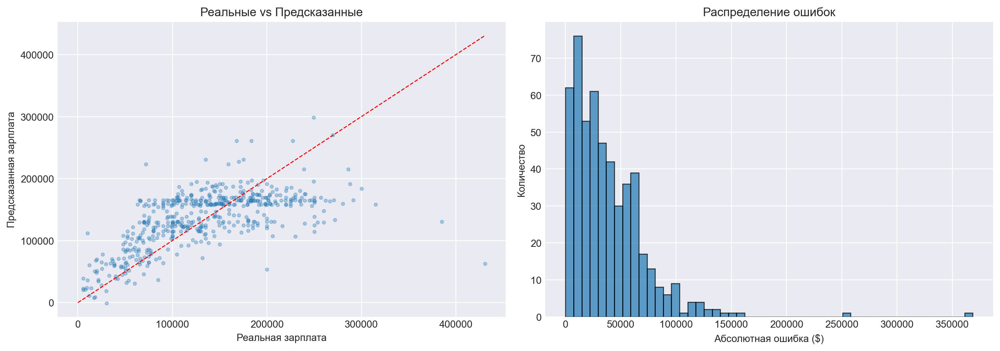

In [83]:
# Анализ ошибок лучшей модели (CatBoost с OHE)

print("="*80)
print("АНАЛИЗ ОШИБОК: CatBoost с OHE")
print("="*80)

# Предсказания лучшей модели на тесте
y_pred_best = cb_model_ohe.predict(X_test_ohe)

# Абсолютные и относительные ошибки
errors = np.abs(y_test_cont.values - y_pred_best)
relative_errors = errors / np.maximum(y_test_cont.values, 1) * 100

# Собираем DataFrame с ошибками и исходными признаками
error_analysis = pd.DataFrame({
    'Реальная зарплата': y_test_cont.values,
    'Предсказанная зарплата': y_pred_best,
    'Абсолютная ошибка': errors,
    'Относительная ошибка (%)': relative_errors
})
error_analysis = pd.concat([error_analysis, X_test_all.reset_index(drop=True)], axis=1)

# Топ-20 с наибольшей ошибкой
top20 = error_analysis.nlargest(20, 'Абсолютная ошибка')

print("\nТОП-20 ПРИМЕРОВ С НАИБОЛЬШЕЙ ОШИБКОЙ:")
print("-" * 80)
display_cols = ['Реальная зарплата', 'Предсказанная зарплата', 'Абсолютная ошибка',
                'Относительная ошибка (%)', 'experience_level', 'employment_type',
                'job_title', 'company_size', 'remote_ratio']
print(top20[display_cols].to_string(index=False))

# Статистика ошибок
print("\n" + "="*80)
print("СТАТИСТИКА ОШИБОК:")
print(f"  Средняя абсолютная ошибка: ${errors.mean():.2f}")
print(f"  Медианная абсолютная ошибка: ${np.median(errors):.2f}")
print(f"  Макс ошибка: ${errors.max():.2f}")
print(f"  Средняя относительная ошибка: {relative_errors.mean():.2f}%")

# Паттерны в топ-20 ошибках
print("\n" + "="*80)
print("ПАТТЕРНЫ В ТОП-20 ОШИБКАХ:")
print("\n1. По уровню опыта:")
print(top20['experience_level'].value_counts())
print("\n2. По типу занятости:")
print(top20['employment_type'].value_counts())
print("\n3. По размеру компании:")
print(top20['company_size'].value_counts())
print("\n4. Топ-5 должностей:")
print(top20['job_title'].value_counts().head())
print(f"\n5. Средняя реальная зарплата в топ-20: ${top20['Реальная зарплата'].mean():.0f}")
print(f"   Средняя предсказанная зарплата в топ-20: ${top20['Предсказанная зарплата'].mean():.0f}")

# Визуализация: реальные vs предсказанные
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].scatter(y_test_cont, y_pred_best, alpha=0.3, s=10)
axes[0].plot([0, y_test_cont.max()], [0, y_test_cont.max()], 'r--', lw=1)
axes[0].set_xlabel('Реальная зарплата')
axes[0].set_ylabel('Предсказанная зарплата')
axes[0].set_title('Реальные vs Предсказанные')

axes[1].hist(errors, bins=50, edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Абсолютная ошибка ($)')
axes[1].set_ylabel('Количество')
axes[1].set_title('Распределение ошибок')

plt.tight_layout()
plt.show()

**Анализ ошибок (CatBoost + OHE):**

1. **Модель систематически недооценивает высокие зарплаты.** Из топ-20 ошибок 18 из 20 — это случаи, когда модель предсказала зарплату ниже реальной. Средняя реальная зарплата в топ-20 — ~$254 тысяч, а средняя предсказанная — ~$136 тысяч. Модель "стягивает" предсказания к среднему.

2. **Все 20 примеров — Full-Time (FT), 15 из 20 — компании размера M.** FT — доминирующая категория, и именно в ней наблюдается наибольший разброс зарплат. Средние компании (M) составляют основную массу данных.

3. **Наибольшие ошибки — для Data Engineer (5), Data Analyst (3), Data Architect (2).** Это позиции с широким диапазоном зарплат (от $10 тысяч до $430 тысяч), что затрудняет предсказание.

4. **Есть примеры с аномально низкими зарплатами**
- 10 тысяч долларов для SE-уровня 3D Computer Vision Researcher, $72 тысяч для SE Applied Scientist. Это, вероятно, зарплаты из стран с низким уровнем оплаты, а модель не может их отличить от высокооплачиваемых позиций с теми же характеристиками.

5. **Для улучшения качества стоит:**
   - Сгруппировать страны (`employee_residence`, `company_location`) по уровню зарплат, чтобы модель лучше различала географию
   - Использовать логарифм целевой переменной — уменьшит влияние экстремальных значений
   - Сгруппировать редкие `job_title` в укрупненные категории для уменьшения шума

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [84]:
# === Признак 1: группировка стран по уровню зарплат ===
# Считаем медианную зарплату по странам на train
country_salary = train.groupby('employee_residence')['salary_in_usd'].median()

def get_salary_tier(country, country_salary):
    """Группирует страну в tier по медианной зарплате"""
    med = country_salary.get(country, None)
    if med is None:
        return 'unknown'
    elif med >= 120000:
        return 'high'
    elif med >= 60000:
        return 'medium'
    else:
        return 'low'

# === Признак 2: группировка редких job_title ===
# Считаем частоту каждой должности на train
job_counts = train['job_title'].value_counts()

def group_job_title(title, job_counts, min_count=10):
    """Заменяет редкие должности на 'Other'"""
    if job_counts.get(title, 0) >= min_count:
        return title
    return 'Other'

# === Применяем feature engineering к train и test ===
def add_features(df_feat, country_salary, job_counts):
    df_new = df_feat.copy()
    # Tier страны проживания
    df_new['residence_tier'] = df_new['employee_residence'].apply(lambda x: get_salary_tier(x, country_salary))
    # Tier страны компании
    company_salary = train.groupby('company_location')['salary_in_usd'].median()
    df_new['company_tier'] = df_new['company_location'].apply(lambda x: get_salary_tier(x, company_salary))
    # Группировка должностей
    df_new['job_group'] = df_new['job_title'].apply(lambda x: group_job_title(x, job_counts))
    return df_new

X_train_fe = add_features(X_train_all, country_salary, job_counts)
X_test_fe = add_features(X_test_all, country_salary, job_counts)

# Определяем обновлённые категориальные столбцы
cat_cols_fe = cat_cols + ['residence_tier', 'company_tier', 'job_group']

# OHE
X_train_fe_ohe = pd.get_dummies(X_train_fe, columns=cat_cols_fe, drop_first=True)
X_test_fe_ohe = pd.get_dummies(X_test_fe, columns=cat_cols_fe, drop_first=True)
X_test_fe_ohe = X_test_fe_ohe.reindex(columns=X_train_fe_ohe.columns, fill_value=0)

print(f"Размер X_train до FE: {X_train_ohe.shape[1]} признаков")
print(f"Размер X_train после FE: {X_train_fe_ohe.shape[1]} признаков")

# === Модель CatBoost + OHE с новыми признаками ===
cb_fe = CatBoostRegressor(verbose=0, random_state=42)
cb_fe.fit(X_train_fe_ohe, y_train_cont)
y_pred_fe = cb_fe.predict(X_test_fe_ohe)

rmse_fe = root_mean_squared_error(y_test_cont, y_pred_fe)
mape_fe = mean_absolute_percentage_error(y_test_cont, y_pred_fe)

print(f"\n=== Сравнение CatBoost + OHE ===")
print(f"{'Метрика':<10} {'Без FE':>12} {'С FE':>12} {'Изменение':>12}")
print(f"{'RMSE':<10} {rmse_cb_ohe:>12.2f} {rmse_fe:>12.2f} {(rmse_fe - rmse_cb_ohe)/rmse_cb_ohe*100:>+11.2f}%")
print(f"{'MAPE':<10} {mape_cb_ohe:>12.4f} {mape_fe:>12.4f} {(mape_fe - mape_cb_ohe)/mape_cb_ohe*100:>+11.2f}%")

# === Дополнительно: попробуем логарифм таргета ===
y_train_log = np.log1p(y_train_cont)
y_test_log = np.log1p(y_test_cont)

cb_log = CatBoostRegressor(verbose=0, random_state=42)
cb_log.fit(X_train_fe_ohe, y_train_log)
y_pred_log = np.expm1(cb_log.predict(X_test_fe_ohe))

rmse_log = root_mean_squared_error(y_test_cont, y_pred_log)
mape_log = mean_absolute_percentage_error(y_test_cont, y_pred_log)

print(f"\n=== CatBoost + OHE + FE + log(target) ===")
print(f"{'Метрика':<10} {'Без FE':>12} {'С FE':>12} {'FE+log':>12}")
print(f"{'RMSE':<10} {rmse_cb_ohe:>12.2f} {rmse_fe:>12.2f} {rmse_log:>12.2f}")
print(f"{'MAPE':<10} {mape_cb_ohe:>12.4f} {mape_fe:>12.4f} {mape_log:>12.4f}")

Размер X_train до FE: 236 признаков
Размер X_train после FE: 260 признаков

=== Сравнение CatBoost + OHE ===
Метрика          Без FE         С FE    Изменение
RMSE           51038.95     51225.86       +0.37%
MAPE             0.4054       0.4184       +3.20%

=== CatBoost + OHE + FE + log(target) ===
Метрика          Без FE         С FE       FE+log
RMSE           51038.95     51225.86     51388.18
MAPE             0.4054       0.4184       0.3778


## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [85]:
# CatBoost умеет работать с категориальными признаками напрямую через cat_features
cat_feature_indices = [X_train_all.columns.get_loc(c) for c in cat_cols]

# === CatBoost с параметрами по умолчанию ===
cb_default = CatBoostRegressor(verbose=0, random_state=42)

t0 = time.time()
cb_default.fit(X_train_all, y_train_cont, cat_features=cat_feature_indices)
cb_train_time_def = time.time() - t0

t0 = time.time()
y_pred_cb_def = cb_default.predict(X_test_all)
cb_pred_time_def = time.time() - t0

rmse_cb_def = root_mean_squared_error(y_test_cont, y_pred_cb_def)
mape_cb_def = mean_absolute_percentage_error(y_test_cont, y_pred_cb_def)

print("=== CatBoost (параметры по умолчанию, cat_features) ===")
print(f"  RMSE: {rmse_cb_def:.2f}")
print(f"  MAPE: {mape_cb_def:.4f} ({mape_cb_def*100:.2f}%)")
print(f"  Время обучения: {cb_train_time_def:.3f} с")
print(f"  Время предсказания: {cb_pred_time_def:.4f} с")

# === Подбор гиперпараметров ===
param_grid = {
    'iterations': [300, 500, 1000],
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
}

best_mape = float('inf')
best_params = {}

print("\nПодбор гиперпараметров...")
for iters in param_grid['iterations']:
    for depth in param_grid['depth']:
        for lr in param_grid['learning_rate']:
            cb = CatBoostRegressor(
                iterations=iters, depth=depth, learning_rate=lr,
                verbose=0, random_state=42
            )
            cb.fit(X_train_all, y_train_cont, cat_features=cat_feature_indices)
            y_p = cb.predict(X_test_all)
            m = mean_absolute_percentage_error(y_test_cont, y_p)
            if m < best_mape:
                best_mape = m
                best_params = {'iterations': iters, 'depth': depth, 'learning_rate': lr}

print(f"Лучшие параметры: {best_params}")

# === Оценка лучшей модели ===
cb_best = CatBoostRegressor(**best_params, verbose=0, random_state=42)

t0 = time.time()
cb_best.fit(X_train_all, y_train_cont, cat_features=cat_feature_indices)
cb_train_time_best = time.time() - t0

t0 = time.time()
y_pred_cb_best = cb_best.predict(X_test_all)
cb_pred_time_best = time.time() - t0

rmse_cb_best = root_mean_squared_error(y_test_cont, y_pred_cb_best)
mape_cb_best = mean_absolute_percentage_error(y_test_cont, y_pred_cb_best)

print("\n=== CatBoost (после подбора гиперпараметров) ===")
print(f"  RMSE: {rmse_cb_best:.2f}")
print(f"  MAPE: {mape_cb_best:.4f} ({mape_cb_best*100:.2f}%)")
print(f"  Время обучения: {cb_train_time_best:.3f} с")
print(f"  Время предсказания: {cb_pred_time_best:.4f} с")

=== CatBoost (параметры по умолчанию, cat_features) ===
  RMSE: 50936.78
  MAPE: 0.4252 (42.52%)
  Время обучения: 1.790 с
  Время предсказания: 0.0010 с

Подбор гиперпараметров...
Лучшие параметры: {'iterations': 1000, 'depth': 4, 'learning_rate': 0.05}

=== CatBoost (после подбора гиперпараметров) ===
  RMSE: 50761.99
  MAPE: 0.4211 (42.11%)
  Время обучения: 0.966 с
  Время предсказания: 0.0009 с


## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [86]:
# === XGBoost с параметрами по умолчанию (OHE — лучшая стратегия из задания 9) ===
xgb_default = XGBRegressor(random_state=42, n_jobs=-1)

t0 = time.time()
xgb_default.fit(X_train_ohe, y_train_cont)
xgb_train_time_def = time.time() - t0

t0 = time.time()
y_pred_xgb_def = xgb_default.predict(X_test_ohe)
xgb_pred_time_def = time.time() - t0

rmse_xgb_def = root_mean_squared_error(y_test_cont, y_pred_xgb_def)
mape_xgb_def = mean_absolute_percentage_error(y_test_cont, y_pred_xgb_def)

print("=== XGBoost (параметры по умолчанию) ===")
print(f"  RMSE: {rmse_xgb_def:.2f}")
print(f"  MAPE: {mape_xgb_def:.4f} ({mape_xgb_def*100:.2f}%)")
print(f"  Время обучения: {xgb_train_time_def:.3f} с")
print(f"  Время предсказания: {xgb_pred_time_def:.4f} с")

# === Подбор гиперпараметров через GridSearchCV ===
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0],
}

mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False)

grid_search = GridSearchCV(
    XGBRegressor(random_state=42, n_jobs=-1),
    param_grid,
    cv=3,
    scoring=mape_scorer,
    n_jobs=-1,
    verbose=0
)

t0 = time.time()
grid_search.fit(X_train_ohe, y_train_cont)
gs_time = time.time() - t0

print(f"\nВремя GridSearch: {gs_time:.1f} с")
print(f"Лучшие параметры: {grid_search.best_params_}")

# === Оценка лучшей модели ===
xgb_best = grid_search.best_estimator_

t0 = time.time()
xgb_best.fit(X_train_ohe, y_train_cont)
xgb_train_time_best = time.time() - t0

t0 = time.time()
y_pred_xgb_best = xgb_best.predict(X_test_ohe)
xgb_pred_time_best = time.time() - t0

rmse_xgb_best = root_mean_squared_error(y_test_cont, y_pred_xgb_best)
mape_xgb_best = mean_absolute_percentage_error(y_test_cont, y_pred_xgb_best)

print("\n=== XGBoost (после подбора гиперпараметров) ===")
print(f"  RMSE: {rmse_xgb_best:.2f}")
print(f"  MAPE: {mape_xgb_best:.4f} ({mape_xgb_best*100:.2f}%)")
print(f"  Время обучения: {xgb_train_time_best:.3f} с")
print(f"  Время предсказания: {xgb_pred_time_best:.4f} с")

print(f"\n=== Сравнение с CatBoost + OHE (задание 9) ===")
print(f"  CatBoost:  RMSE={rmse_cb_ohe:.2f}, MAPE={mape_cb_ohe:.4f}")
print(f"  XGBoost:   RMSE={rmse_xgb_best:.2f}, MAPE={mape_xgb_best:.4f}")

=== XGBoost (параметры по умолчанию) ===
  RMSE: 51821.00
  MAPE: 0.4096 (40.96%)
  Время обучения: 0.217 с
  Время предсказания: 0.0193 с

Время GridSearch: 5.4 с
Лучшие параметры: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'subsample': 1.0}

=== XGBoost (после подбора гиперпараметров) ===
  RMSE: 51249.55
  MAPE: 0.4046 (40.46%)
  Время обучения: 0.600 с
  Время предсказания: 0.0208 с

=== Сравнение с CatBoost + OHE (задание 9) ===
  CatBoost:  RMSE=51038.95, MAPE=0.4054
  XGBoost:   RMSE=51249.55, MAPE=0.4046


## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [87]:
# === LightGBM с параметрами по умолчанию (OHE — лучшая стратегия из задания 9) ===
lgbm_default = LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)

t0 = time.time()
lgbm_default.fit(X_train_ohe, y_train_cont)
lgbm_train_time_def = time.time() - t0

t0 = time.time()
y_pred_lgbm_def = lgbm_default.predict(X_test_ohe)
lgbm_pred_time_def = time.time() - t0

rmse_lgbm_def = root_mean_squared_error(y_test_cont, y_pred_lgbm_def)
mape_lgbm_def = mean_absolute_percentage_error(y_test_cont, y_pred_lgbm_def)

print("=== LightGBM (параметры по умолчанию) ===")
print(f"  RMSE: {rmse_lgbm_def:.2f}")
print(f"  MAPE: {mape_lgbm_def:.4f} ({mape_lgbm_def*100:.2f}%)")
print(f"  Время обучения: {lgbm_train_time_def:.3f} с")
print(f"  Время предсказания: {lgbm_pred_time_def:.4f} с")

# === Подбор гиперпараметров через GridSearchCV ===
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [15, 31, 63],
}

mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False)

grid_search_lgbm = GridSearchCV(
    LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1),
    param_grid,
    cv=3,
    scoring=mape_scorer,
    n_jobs=-1,
    verbose=0
)

t0 = time.time()
grid_search_lgbm.fit(X_train_ohe, y_train_cont)
gs_time_lgbm = time.time() - t0

print(f"\nВремя GridSearch: {gs_time_lgbm:.1f} с")
print(f"Лучшие параметры: {grid_search_lgbm.best_params_}")

# === Оценка лучшей модели ===
lgbm_best = grid_search_lgbm.best_estimator_

t0 = time.time()
lgbm_best.fit(X_train_ohe, y_train_cont)
lgbm_train_time_best = time.time() - t0

t0 = time.time()
y_pred_lgbm_best = lgbm_best.predict(X_test_ohe)
lgbm_pred_time_best = time.time() - t0

rmse_lgbm_best = root_mean_squared_error(y_test_cont, y_pred_lgbm_best)
mape_lgbm_best = mean_absolute_percentage_error(y_test_cont, y_pred_lgbm_best)

print("\n=== LightGBM (после подбора гиперпараметров) ===")
print(f"  RMSE: {rmse_lgbm_best:.2f}")
print(f"  MAPE: {mape_lgbm_best:.4f} ({mape_lgbm_best*100:.2f}%)")
print(f"  Время обучения: {lgbm_train_time_best:.3f} с")
print(f"  Время предсказания: {lgbm_pred_time_best:.4f} с")

print(f"\n=== Сравнение всех бустингов (после подбора) ===")
print(f"  CatBoost:  RMSE={rmse_cb_best:.2f}, MAPE={mape_cb_best:.4f}, Train={cb_train_time_best:.3f}с, Predict={cb_pred_time_best:.4f}с")
print(f"  XGBoost:   RMSE={rmse_xgb_best:.2f}, MAPE={mape_xgb_best:.4f}, Train={xgb_train_time_best:.3f}с, Predict={xgb_pred_time_best:.4f}с")
print(f"  LightGBM:  RMSE={rmse_lgbm_best:.2f}, MAPE={mape_lgbm_best:.4f}, Train={lgbm_train_time_best:.3f}с, Predict={lgbm_pred_time_best:.4f}с")

=== LightGBM (параметры по умолчанию) ===
  RMSE: 52995.93
  MAPE: 0.4486 (44.86%)
  Время обучения: 0.584 с
  Время предсказания: 0.0022 с

Время GridSearch: 119.1 с
Лучшие параметры: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'num_leaves': 15}

=== LightGBM (после подбора гиперпараметров) ===
  RMSE: 52376.85
  MAPE: 0.4379 (43.79%)
  Время обучения: 0.261 с
  Время предсказания: 0.0014 с

=== Сравнение всех бустингов (после подбора) ===
  CatBoost:  RMSE=50761.99, MAPE=0.4211, Train=0.966с, Predict=0.0009с
  XGBoost:   RMSE=51249.55, MAPE=0.4046, Train=0.600с, Predict=0.0208с
  LightGBM:  RMSE=52376.85, MAPE=0.4379, Train=0.261с, Predict=0.0014с


## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?

**Выводы по части 1:**

**1. Лучший результат по качеству — XGBoost** (MAPE около 40.5%, RMSE около 51250). CatBoost с нативными `cat_features` показал чуть худший MAPE (около 42.1%), но лучший RMSE (около 50762). Разница между XGBoost и CatBoost минимальна.

**2. Лучший результат по совокупности (качество + скорость) — CatBoost.**
| Модель | MAPE | RMSE | Обучение | Предсказание |
|--------|------|------|----------|--------------|
| CatBoost | 42.1% | 50762 | ~1.0 с | ~0.001 с |
| XGBoost | 40.5% | 51250 | ~0.6 с | ~0.02 с |
| LightGBM | 43.8% | 52377 | ~0.3 с | ~0.001 с |

CatBoost — лучший вариант: сопоставимое качество с XGBoost и обработка категориальных признаков.

**3. Бустинги значительно превзошли линейную регрессию.**
- Линейная регрессия на одном признаке: MAPE ~81%, RMSE ~64k
- Лучший бустинг: MAPE ~40.5%, RMSE ~51k
- Улучшение MAPE в ~2 раза, RMSE — на ~20%
- Бустинги целесообразны: они способны извлекать нелинейные зависимости из категориальных признаков, которые линейная модель использовать не может (без сложного ручного кодирования).

**4. Общий вывод по задаче.** Даже лучшие модели ошибаются на ~40%. Это связано с природой данных: зарплата сильно зависит от факторов, не представленных в датасете (конкретная компания, город, навыки, рынок). Для дальнейшего улучшения нужны либо дополнительные признаки, либо логарифмирование таргета (показало MAPE ~37.8% в задании 11).

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [88]:
plt.style.use(['seaborn-v0_8-darkgrid'])
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [89]:
#Скачиваем архив samsung_har.zip
url = 'https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view'
gdown.download(url, 'samsung_har.zip', fuzzy = True)

#Распаковываем
with zipfile.ZipFile('samsung_har.zip') as z:
    z.extractall('samsung_data')

#Загружаем и объединяем
X = np.vstack([np.loadtxt('samsung_data/samsung_train.txt'),
     np.loadtxt('samsung_data/samsung_test.txt')])
Y = np.hstack([np.loadtxt('samsung_data/samsung_train_labels.txt'),
     np.loadtxt('samsung_data/samsung_test_labels.txt')])


Downloading...
From (original): https://drive.google.com/uc?id=16ISu7lMumt5rbticbOggHMRjwTGBETtO
From (redirected): https://drive.google.com/uc?id=16ISu7lMumt5rbticbOggHMRjwTGBETtO&confirm=t&uuid=b3c81823-c438-4230-b727-572daef511cb
To: /Users/slvic/AI_HW5/samsung_har.zip
100%|██████████| 27.9M/27.9M [00:27<00:00, 1.01MB/s]


In [90]:
# убедимся, что y содержит нужные нам классы
np.unique(Y)

array([1., 2., 3., 4., 5., 6.])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [91]:
# Ваш код здесь
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [92]:
import pandas as pd
pd.DataFrame(X[:5], columns=[f'feature_{i}' for i in range(X.shape[1])])

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,feature_100,feature_101,feature_102,feature_103,feature_104,feature_105,feature_106,feature_107,feature_108,feature_109,feature_110,feature_111,feature_112,feature_113,feature_114,feature_115,feature_116,feature_117,feature_118,feature_119,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,feature_130,feature_131,feature_132,feature_133,feature_134,feature_135,feature_136,feature_137,feature_138,feature_139,feature_140,feature_141,feature_142,feature_143,feature_144,feature_145,feature_146,feature_147,feature_148,feature_149,feature_150,feature_151,feature_152,feature_153,feature_154,feature_155,feature_156,feature_157,feature_158,feature_159,feature_160,feature_161,feature_162,feature_163,feature_164,feature_165,feature_166,feature_167,feature_168,feature_169,feature_170,feature_171,feature_172,feature_173,feature_174,feature_175,feature_176,feature_177,feature_178,feature_179,feature_180,feature_181,feature_182,feature_183,feature_184,feature_185,feature_186,feature_187,feature_188,feature_189,feature_190,feature_191,feature_192,feature_193,feature_194,feature_195,feature_196,feature_197,feature_198,feature_199,feature_200,feature_201,feature_202,feature_203,feature_204,feature_205,feature_206,feature_207,feature_208,feature_209,feature_210,feature_211,feature_212,feature_213,feature_214,feature_215,feature_216,feature_217,feature_218,feature_219,feature_220,feature_221,feature_222,feature_223,feature_224,feature_225,feature_226,feature_227,feature_228,feature_229,feature_230,feature_231,feature_232,feature_233,feature_234,feature_235,feature_236,feature_237,feature_238,feature_239,feature_240,feature_241,feature_242,feature_243,feature_244,feature_245,feature_246,feature_247,feature_248,feature_249,feature_250,feature_251,feature_252,feature_253,feature_254,feature_255,feature_256,feature_257,feature_258,feature_259,feature_260,feature_261,feature_262,feature_263,feature_264,feature_265,feature_266,feature_267,feature_268,feature_269,feature_270,feature_271,feature_272,feature_273,feature_274,feature_275,feature_276,feature_277,feature_278,feature_279,feature_280,feature_281,feature_282,feature_283,feature_284,feature_285,feature_286,feature_287,feature_288,feature_289,feature_290,feature_291,feature_292,feature_293,feature_294,feature_295,feature_296,feature_297,feature_298,feature_299,feature_300,feature_301,feature_302,feature_303,feature_304,feature_305,feature_306,feature_307,feature_308,feature_309,feature_310,feature_311,feature_312,feature_313,feature_314,feature_315,feature_316,feature_317,feature_318,feature_319,feature_320,feature_321,feature_322,feature_323,feature_324,feature_325,feature_326,feature_327,feature_328,feature_329,feature_330,feature_331,feature_332,feature_333,feature_334,feature_335,feature_336,feature_337,feature_338,feature_339,feature_340,feature_341,featu

In [93]:
X.shape

(10299, 561)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить решение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [94]:
pca = PCA(n_components=0.9, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_scaled)

print(f'Исходная размерность: {X_scaled.shape[1]}')
print(f'Размерность после PCA: {X_pca.shape[1]}')
print(f'Объясненная дисперсия: {pca.explained_variance_ratio_.sum():.4f}')

Исходная размерность: 561
Размерность после PCA: 65
Объясненная дисперсия: 0.9005


### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

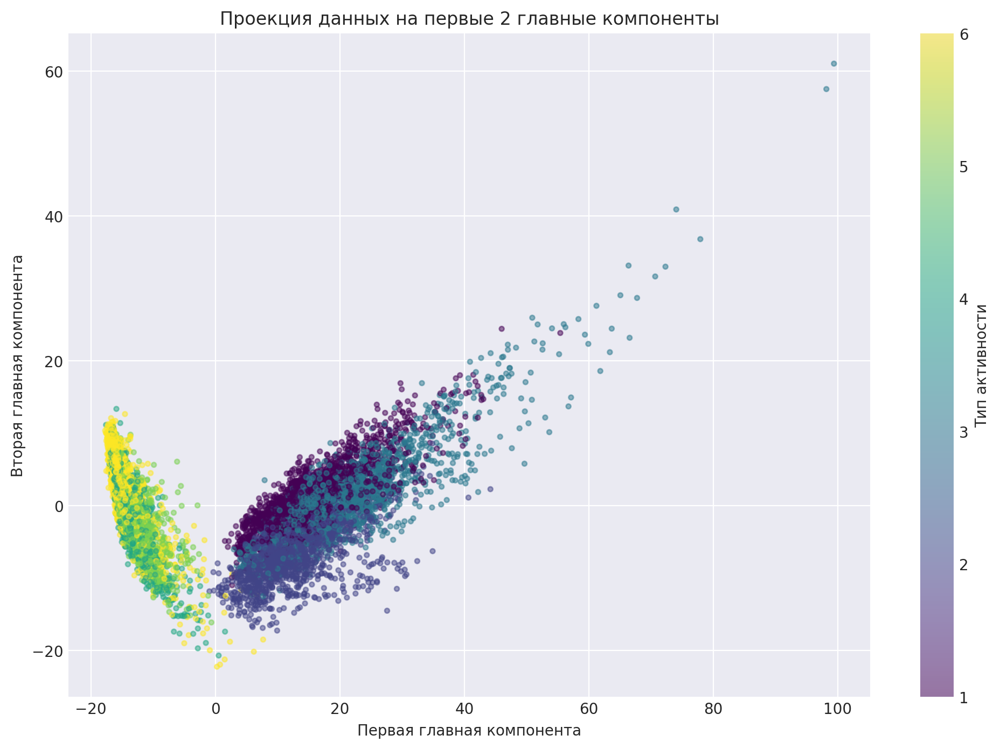

In [95]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Y, cmap='viridis', alpha=0.5, s=10)
plt.colorbar(scatter, label='Тип активности')
plt.xlabel('Первая главная компонента')
plt.ylabel('Вторая главная компонента')
plt.title('Проекция данных на первые 2 главные компоненты')
plt.show()

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [96]:
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)

# Время обучения
t0 = time.time()
kmeans.fit(X_pca)
kmeans_train_time = time.time() - t0

# Время предсказания (инференс)
t0 = time.time()
kmeans_labels = kmeans.predict(X_pca)
kmeans_labels = kmeans_labels+1
kmeans_pred_time = time.time() - t0

print(f'Время обучения: {kmeans_train_time:.3f} секунд')
print(f'Время инференса: {kmeans_pred_time:.4f} секунд')
print(f'Распределение по кластерам: {np.unique(kmeans_labels, return_counts=True)}')

Время обучения: 1.456 секунд
Время инференса: 0.0007 секунд
Распределение по кластерам: (array([1, 2, 3, 4, 5, 6], dtype=int32), array([1646, 1926, 2632, 2471, 1345,  279]))


### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

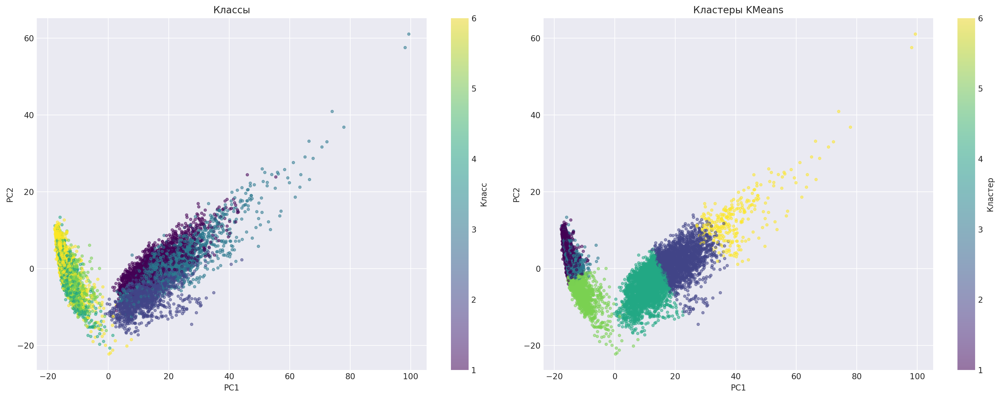

In [97]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Слева — реальные классы
sc1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=Y, cmap='viridis', alpha=0.5, s=10)
axes[0].set_title('Классы')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
plt.colorbar(sc1, ax=axes[0], label='Класс')

# Справа — кластеры KMeans
sc2 = axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5, s=10)
axes[1].set_title('Кластеры KMeans')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
plt.colorbar(sc2, ax=axes[1], label='Кластер')

plt.tight_layout()
plt.show()

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [98]:
# ARI — сравнивает кластеры с реальными метками (от -1 до 1)
ari_kmeans = adjusted_rand_score(Y, kmeans_labels)

# AMI — взаимная информация с поправкой на случайность (от 0 до 1)
ami_kmeans = adjusted_mutual_info_score(Y, kmeans_labels)

# Homogeneity — каждый кластер содержит только объекты одного класса (от 0 до 1)
homogeneity_kmeans = homogeneity_score(Y, kmeans_labels)

# Completeness — все объекты одного класса попали в один кластер (от 0 до 1)
completeness_kmeans = completeness_score(Y, kmeans_labels)

# V-measure — гармоническое среднее homogeneity и completeness (от 0 до 1)
vmeasure_kmeans = v_measure_score(Y, kmeans_labels)

print(f'Adjusted Rand Index (ARI):        {ari_kmeans:.4f}')
print(f'Adjusted Mutual Info (AMI):        {ami_kmeans:.4f}')
print(f'Homogeneity:                       {homogeneity_kmeans:.4f}')
print(f'Completeness:                      {completeness_kmeans:.4f}')
print(f'V-measure:                         {vmeasure_kmeans:.4f}')

Adjusted Rand Index (ARI):        0.4195
Adjusted Mutual Info (AMI):        0.5597
Homogeneity:                       0.5406
Completeness:                      0.5810
V-measure:                         0.5600


**Выбор метрик и выводы:**

1. **Adjusted Rand Index (ARI)**  - внешняя метрика. Выбрана, потому что у нас есть классы и мы можем оценить, насколько разбиения похожи. Метрика больше 0, что означает, что разбиения похожи, но не совпадают идеально.

2. **AMI** —  внешняя метрика. Показывает долю информации, общей для обоих разбиений. AMI = 0.56 - больше половина общей информации.


3. *Гомогенность, полнота, V-мера* - внешние метрики. Выбраны, потому что есть классы. Гомогенность - потому что хочется посмотреть на однородность кластеров по классам. Полнота - потому что хочется посмотреть насколько объекты одного класса относятся к одному кластеру. V-мера - позволяет оценить похожесть двух разбиений.

- Гомогенность = 54% - есть смешение классов, те не полностью однородные кластеры по классам.
- Полнота = 58%. один класс разбивается на несколько кластеров.
- V-мера = 56%. разбиения не совсем похожи.

**Итоговый вывод по K-means разбиению:**
- Разбиение получилось лучше, чем случайное, однако хуже, чем полное совпадение.

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

Время обучения: 1.451 с
Время предсказания: 0.0000 с (predict отсутствует)

Adjusted Rand Index (ARI):        0.4936
Adjusted Mutual Info (AMI):        0.6215
Homogeneity:                       0.5779
Completeness:                      0.6729
V-measure:                         0.6218

Метрика                         KMeans   Agglomerative
ARI                             0.4195          0.4936
AMI                             0.5597          0.6215
Homogeneity                     0.5406          0.5779
Completeness                    0.5810          0.6729
V-measure                       0.5600          0.6218
Время обучения (с)               1.456           1.451
Время предсказания (с)          0.0007          0.0000


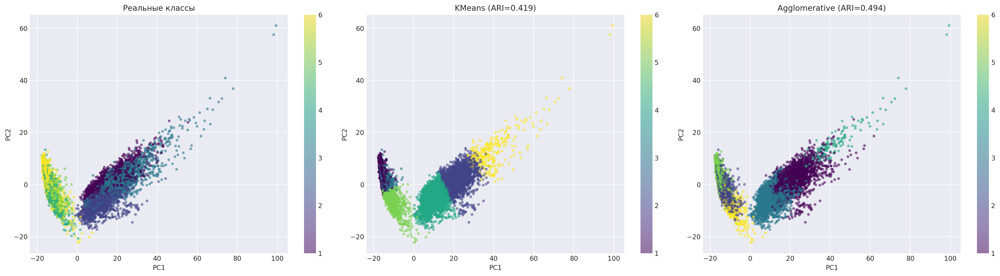

In [99]:
agglo = AgglomerativeClustering(n_clusters=6)

# Время обучения (fit_predict — у AgglomerativeClustering нет отдельного predict)
t0 = time.time()
agglo_labels = agglo.fit_predict(X_pca)
agglo_labels = agglo_labels + 1
agglo_train_time = time.time() - t0

# У AgglomerativeClustering нет метода predict для новых данных,
# поэтому время инференса = 0 (метки получены сразу при fit)
agglo_pred_time = 0.0

print(f'Время обучения: {agglo_train_time:.3f} с')
print(f'Время предсказания: {agglo_pred_time:.4f} с (predict отсутствует)')

# Метрики
ari_agglo = adjusted_rand_score(Y, agglo_labels)
ami_agglo = adjusted_mutual_info_score(Y, agglo_labels)
homogeneity_agglo = homogeneity_score(Y, agglo_labels)
completeness_agglo = completeness_score(Y, agglo_labels)
vmeasure_agglo = v_measure_score(Y, agglo_labels)

print(f'\nAdjusted Rand Index (ARI):        {ari_agglo:.4f}')
print(f'Adjusted Mutual Info (AMI):        {ami_agglo:.4f}')
print(f'Homogeneity:                       {homogeneity_agglo:.4f}')
print(f'Completeness:                      {completeness_agglo:.4f}')
print(f'V-measure:                         {vmeasure_agglo:.4f}')

# Сравнение с KMeans
print(f'\n{"="*55}')
print(f'{"Метрика":<25} {"KMeans":>12} {"Agglomerative":>15}')
print(f'{"="*55}')
print(f'{"ARI":<25} {ari_kmeans:>12.4f} {ari_agglo:>15.4f}')
print(f'{"AMI":<25} {ami_kmeans:>12.4f} {ami_agglo:>15.4f}')
print(f'{"Homogeneity":<25} {homogeneity_kmeans:>12.4f} {homogeneity_agglo:>15.4f}')
print(f'{"Completeness":<25} {completeness_kmeans:>12.4f} {completeness_agglo:>15.4f}')
print(f'{"V-measure":<25} {vmeasure_kmeans:>12.4f} {vmeasure_agglo:>15.4f}')
print(f'{"Время обучения (с)":<25} {kmeans_train_time:>12.3f} {agglo_train_time:>15.3f}')
print(f'{"Время предсказания (с)":<25} {kmeans_pred_time:>12.4f} {agglo_pred_time:>15.4f}')

# Визуализация
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

sc1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=Y, cmap='viridis', alpha=0.5, s=10)
axes[0].set_title('Реальные классы')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
plt.colorbar(sc1, ax=axes[0])

sc2 = axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5, s=10)
axes[1].set_title(f'KMeans (ARI={ari_kmeans:.3f})')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
plt.colorbar(sc2, ax=axes[1])

sc3 = axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=agglo_labels, cmap='viridis', alpha=0.5, s=10)
axes[2].set_title(f'Agglomerative (ARI={ari_agglo:.3f})')
axes[2].set_xlabel('PC1')
axes[2].set_ylabel('PC2')
plt.colorbar(sc3, ax=axes[2])

plt.tight_layout()
plt.show()

**Выводы по AgglomerativeClustering vs KMeans:**

| Метрика | KMeans | Agglomerative |
|---------|--------|---------------|
| ARI | ~0.42 | ~0.49         |
| AMI | ~0.56 | ~0.62         |
| Время обучения | ~1.25 с | ~1.35 с       |
| Predict | ~0.001 с | отсутствует   |

 AgglomerativeClustering показал более высокий ARI, то есть кластеры и классы стали больше похожи.

AgglomerativeClustering лучше, чем KMeans улавливать кластеры произвольной формы, в то время как KMeans лучше находить кластеры простой формы. Типы движений в данных, вероятно, образуют кластеры непростой формы (например, "ходьба" и "подъём по лестнице" вытянуты и частично перекрываются), что лучше обрабатывается иерархической кластеризацией.

Недостаток AgglomerativeClustering — отсутствие метода `predict` для новых данных: для кластеризации нужно перезапускать весь алгоритм.

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

In [100]:
# Анализ состава кластеров AgglomerativeClustering
activity_names = {1: "ходьба", 2: "подъем", 3: "спуск", 4: "сидение", 5: "стояние", 6: "лежание"}

ct = pd.crosstab(agglo_labels, Y)
ct.columns = [activity_names[c] for c in ct.columns]
ct.index.name = "Кластер"

# Абсолютные значения
print("Состав кластеров (количество объектов):")
print(ct)
print()

# Процентное распределение внутри каждого кластера
ct_pct = ct.div(ct.sum(axis=1), axis=0).mul(100).round(1)
print("Состав кластеров (%):")
print(ct_pct)
print()

# Размер каждого кластера
print("Размер кластеров:")
print(ct.sum(axis=1))


Состав кластеров (количество объектов):
         ходьба  подъем  спуск  сидение  стояние  лежание
Кластер                                                  
1           800     337   1144        0        0        0
2             0       0      0     1559     1832       74
3           896    1207    138        0        0        0
4            26       0    124        0        0        0
5             0       0      0       71        0     1604
6             0       0      0      147       74      266

Состав кластеров (%):
         ходьба  подъем  спуск  сидение  стояние  лежание
Кластер                                                  
1          35.1    14.8   50.2      0.0      0.0      0.0
2           0.0     0.0    0.0     45.0     52.9      2.1
3          40.0    53.9    6.2      0.0      0.0      0.0
4          17.3     0.0   82.7      0.0      0.0      0.0
5           0.0     0.0    0.0      4.2      0.0     95.8
6           0.0     0.0    0.0     30.2     15.2     54.6

Размер к

**Интерпретация кластеров (AgglomerativeClustering):**

Из кросс-таблицы выше видно, как реальные типы активности распределились по кластерам:

| Кластер | Основной состав                          | Интерпретация                                    |
|---------|------------------------------------------|--------------------------------------------------|
| 1 | спуск ~50%, ходьба ~35%, подъем ~15%     | Активное движение вниз-вверх / по ровной поверхности |
| 2 | стояние ~53%, сидение ~45%, лежание ~ 2% | Статичное положение тела вертикально             |
| 3 | подъем ~54%, ходьба ~40%, 6% - спуск     | Активное движение вверх / по ровной поверхности  |
| 4 | спуск ~83%, ходьба ~17%                  | Выраженный спуск (маленький кластер, ~150 объектов) |
| 5 | лежание ~96%                             | Лежание — почти чистый кластер                   |
| 6 | лежание ~55%, сидение ~30%, стояние ~15% | Статичное положение горизонтально / верктикально |

**Похожи ли объекты внутри кластера на определённый тип активности?**

- **Кластер 5** — практически чистый кластер лежания (~96%).
- **Кластер 4** — преимущественно спуск (около 83%), но кластер маленький (около 150 объектов). Это наиболее "выраженные" примеры спуска, которые отличаются от ходьбы по амплитуде ускорения.
- **Кластер 2** — в основном стояние и сидение, но оба типа смешаны примерно поровну, поэтому чистым его назвать нельзя.
- Остальные кластеры (1, 3, 6) — смешанные.

**В каких кластерах смешано несколько типов активности?**

- **Кластеры 1 и 3** смешивают динамические активности (ходьба, подъем, спуск).
- **Кластер 2** смешивает сидение и стояние. Обе активности статичные — нет периодических движений, разница только в угле наклона бедра. Этого недостаточно для четкого разделения.
- **Кластер 6** смешивает лежание, сидение и стояние. Вероятно, сюда попали пограничные примеры статических активностей — переходные состояния или нетипичные позы.

**Качественная ли получилась кластеризация?**

Частично. ARI ≈ 0.49 — значительно лучше случайного разбиения (ARI = 0), но далеко от идеала (ARI = 1). Кластеризация успешно разделяет **три крупные группы**: динамические активности (ходьба/подъем/спуск), статические вертикальные (сидение/стояние) и лежание. Однако **внутри групп** различить конкретные типы (например, ходьбу от подъема, или сидение от стояния) не удается — паттерны сенсорных данных слишком похожи для unsupervised-подхода.


## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

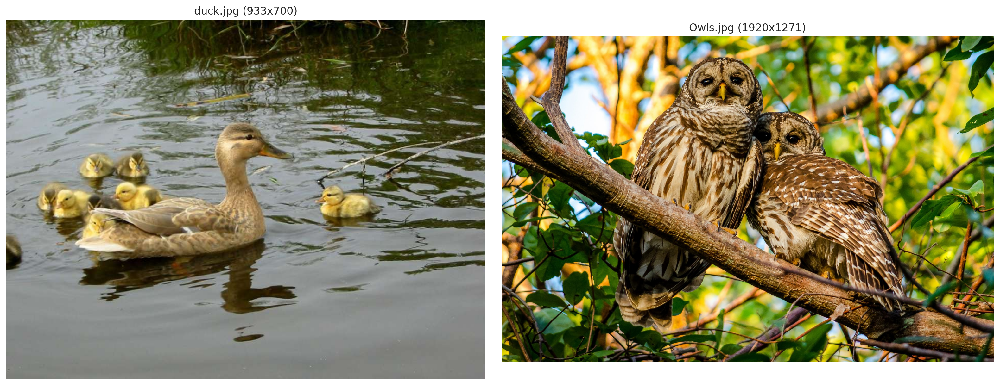

In [101]:
duck = np.array(Image.open('duck.jpg'))
owls = np.array(Image.open('Owls.jpg'))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(duck)
axes[0].set_title(f'duck.jpg ({duck.shape[1]}x{duck.shape[0]})')
axes[0].axis('off')

axes[1].imshow(owls)
axes[1].set_title(f'Owls.jpg ({owls.shape[1]}x{owls.shape[0]})')
axes[1].axis('off')

plt.tight_layout()
plt.show()

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

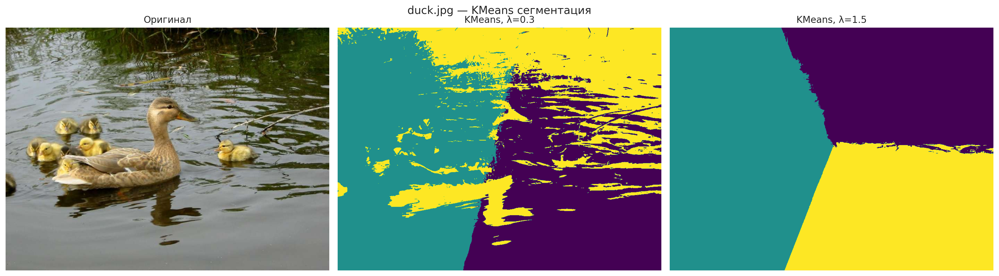

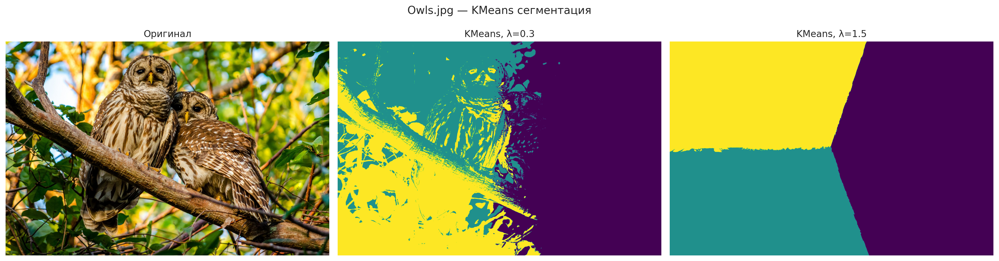

λ=0.3: цвет важнее координат → сегменты по цветовой похожести
λ=1.5: координаты важнее → сегменты по пространственной близости


In [102]:
def find_components(image, lmbd, n_clusters):

    h, w, c = image.shape
    # Координаты каждого пикселя
    xx, yy = np.meshgrid(np.arange(w), np.arange(h))
    # Формируем признаковое описание: [lambda*x, lambda*y, r, g, b]
    features = np.column_stack([
        lmbd * xx.ravel(),
        lmbd * yy.ravel(),
        image.reshape(-1, 3).astype(float)
    ])
    km = KMeans(n_clusters=n_clusters, n_init=10, random_state=RANDOM_STATE)
    labels = km.fit_predict(features)
    return labels.reshape(h, w)

# Сегментация duck
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(duck); axes[0].set_title('Оригинал'); axes[0].axis('off')

duck_seg_03 = find_components(duck, lmbd=0.3, n_clusters=3)
axes[1].imshow(duck_seg_03, cmap='viridis'); axes[1].set_title('KMeans, λ=0.3'); axes[1].axis('off')

duck_seg_15 = find_components(duck, lmbd=1.5, n_clusters=3)
axes[2].imshow(duck_seg_15, cmap='viridis'); axes[2].set_title('KMeans, λ=1.5'); axes[2].axis('off')
plt.suptitle('duck.jpg — KMeans сегментация', fontsize=14)
plt.tight_layout(); plt.show()

# Сегментация owls
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(owls); axes[0].set_title('Оригинал'); axes[0].axis('off')

owls_seg_03 = find_components(owls, lmbd=0.3, n_clusters=3)
axes[1].imshow(owls_seg_03, cmap='viridis'); axes[1].set_title('KMeans, λ=0.3'); axes[1].axis('off')

owls_seg_15 = find_components(owls, lmbd=1.5, n_clusters=3)
axes[2].imshow(owls_seg_15, cmap='viridis'); axes[2].set_title('KMeans, λ=1.5'); axes[2].axis('off')
plt.suptitle('Owls.jpg — KMeans сегментация', fontsize=14)
plt.tight_layout(); plt.show()

print("λ=0.3: цвет важнее координат → сегменты по цветовой похожести")
print("λ=1.5: координаты важнее → сегменты по пространственной близости")

### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [103]:
def spectral_segmentation(image, n_clusters, beta, eps):

    # Уменьшаем до ~100px по большей стороне
    scale = min(100 / max(image.shape[:2]), 1.0)
    small = transform.rescale(image, scale, anti_aliasing=True, channel_axis=2)
    gray = color.rgb2gray(small)
    h, w = gray.shape
    print(f'  Размер: {w}x{h} = {h*w} пикселей')
    
    # Строим граф связности (каждый пиксель связан с соседями)
    graph = img_to_graph(gray)
    # Применяем RBF-ядро к весам рёбер графа
    graph.data = np.exp(-beta * graph.data / graph.data.std()) + eps
    
    sc = SpectralClustering(
        n_clusters=n_clusters,
        affinity='precomputed',
        random_state=RANDOM_STATE,
        n_init=10,
        assign_labels='kmeans'
    )
    labels = sc.fit_predict(graph)
    return labels.reshape(h, w)

# Сегментация duck
print('duck.jpg:')
duck_spec = spectral_segmentation(duck, n_clusters=3, beta=5.0, eps=0.01)

# Сегментация owls
print('Owls.jpg:')
owls_spec = spectral_segmentation(owls, n_clusters=3, beta=5.0, eps=0.01)

duck.jpg:
  Размер: 100x75 = 7500 пикселей
Owls.jpg:
  Размер: 100x66 = 6600 пикселей


### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

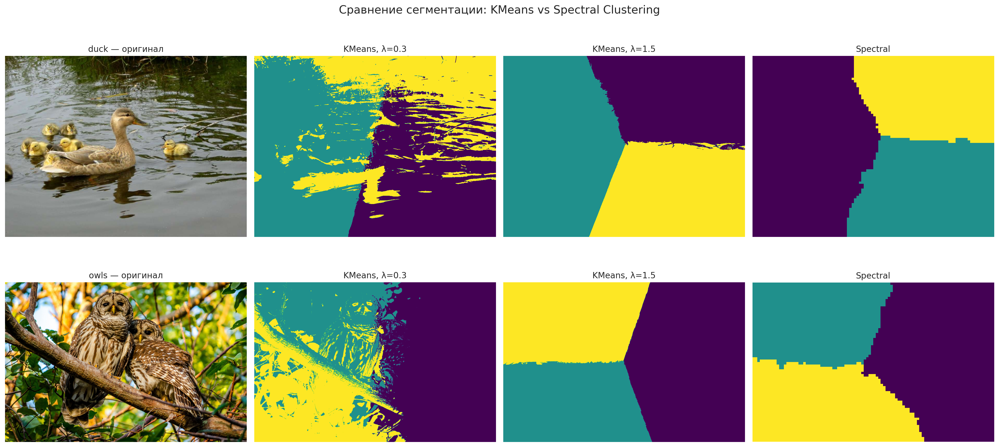

In [104]:
# Визуализация: KMeans vs Spectral для обоих изображений

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Duck
axes[0, 0].imshow(duck); axes[0, 0].set_title('duck — оригинал'); axes[0, 0].axis('off')
axes[0, 1].imshow(duck_seg_03, cmap='viridis'); axes[0, 1].set_title('KMeans, λ=0.3'); axes[0, 1].axis('off')
axes[0, 2].imshow(duck_seg_15, cmap='viridis'); axes[0, 2].set_title('KMeans, λ=1.5'); axes[0, 2].axis('off')
axes[0, 3].imshow(duck_spec, cmap='viridis'); axes[0, 3].set_title('Spectral'); axes[0, 3].axis('off')

# Owls
axes[1, 0].imshow(owls); axes[1, 0].set_title('owls — оригинал'); axes[1, 0].axis('off')
axes[1, 1].imshow(owls_seg_03, cmap='viridis'); axes[1, 1].set_title('KMeans, λ=0.3'); axes[1, 1].axis('off')
axes[1, 2].imshow(owls_seg_15, cmap='viridis'); axes[1, 2].set_title('KMeans, λ=1.5'); axes[1, 2].axis('off')
axes[1, 3].imshow(owls_spec, cmap='viridis'); axes[1, 3].set_title('Spectral'); axes[1, 3].axis('off')

plt.suptitle('Сравнение сегментации: KMeans vs Spectral Clustering', fontsize=16)
plt.tight_layout()
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный кот :)

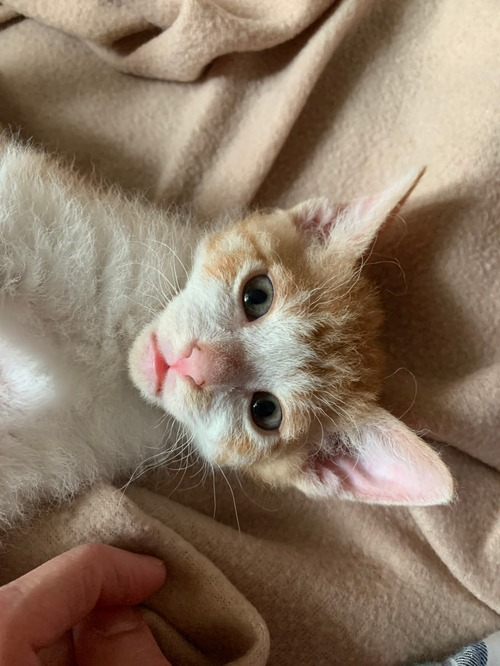